In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

colors = np.arange(0, 256)
figure_size = (40, 10)
histogram_bins_edges = range(0, 257)

noisy1 = cv.imread('resources/practice-3/noisy1.png')
noisy2 = cv.imread('resources/practice-3/noisy2.png', cv.IMREAD_GRAYSCALE)
photo = cv.imread('resources/practice-3/photo.jpg')
ball = cv.imread('resources/practice-3/ball.jpg', cv.IMREAD_GRAYSCALE)

photo_gray = cv.cvtColor(photo, cv.COLOR_BGR2GRAY)

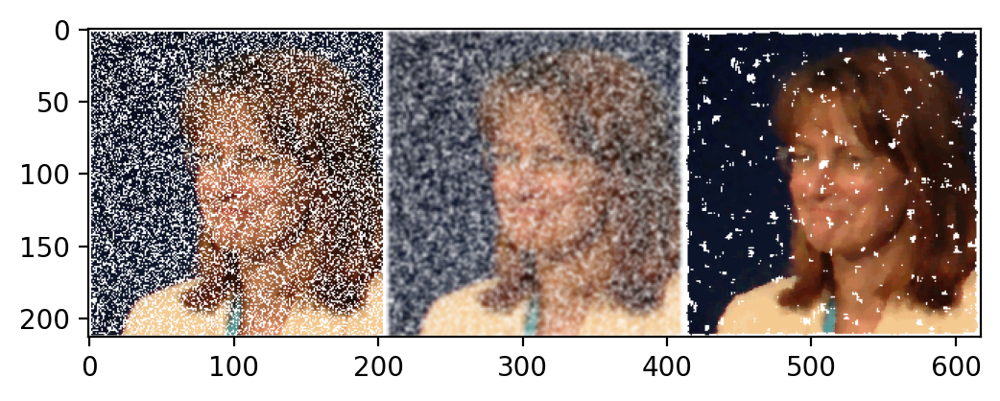

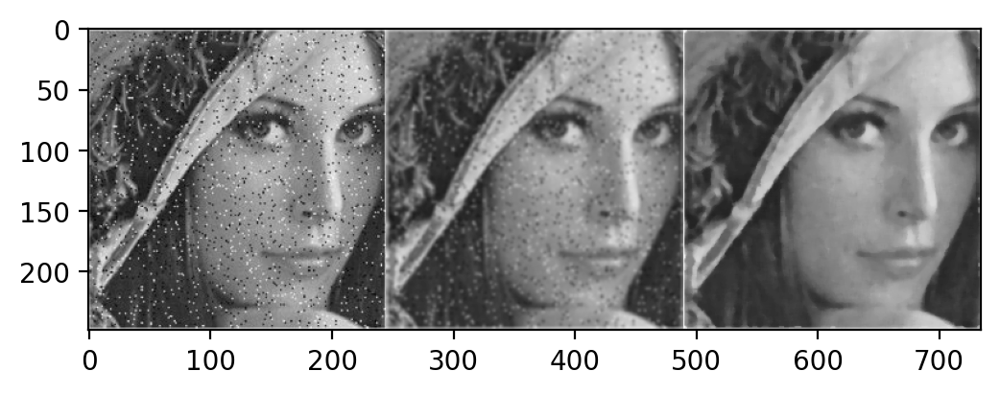

In [2]:
# 1. Приложете 5x5 гаусов и 5x5 медианен филтър върху noisy1.png и noisy2.png. Сравнете получените резултати.

noisy1_gaussian_blur = cv.GaussianBlur(noisy1, ksize=(5, 5), sigmaX=0)
noisy1_median_blur = cv.medianBlur(noisy1, 5)

noisy2_gaussian_blur = cv.GaussianBlur(noisy2, ksize=(5, 5), sigmaX=0)
noisy2_median_blur = cv.medianBlur(noisy2, 5)

plt.figure(dpi=200)
plt.imshow(np.concatenate((cv.cvtColor(noisy1, cv.COLOR_BGR2RGB), cv.cvtColor(noisy1_gaussian_blur, cv.COLOR_BGR2RGB), cv.cvtColor(noisy1_median_blur, cv.COLOR_BGR2RGB)), axis=1))
plt.figure(dpi=200)
plt.imshow(np.concatenate((noisy2, noisy2_gaussian_blur, noisy2_median_blur), axis=1), 'gray', vmin=0, vmax=255)

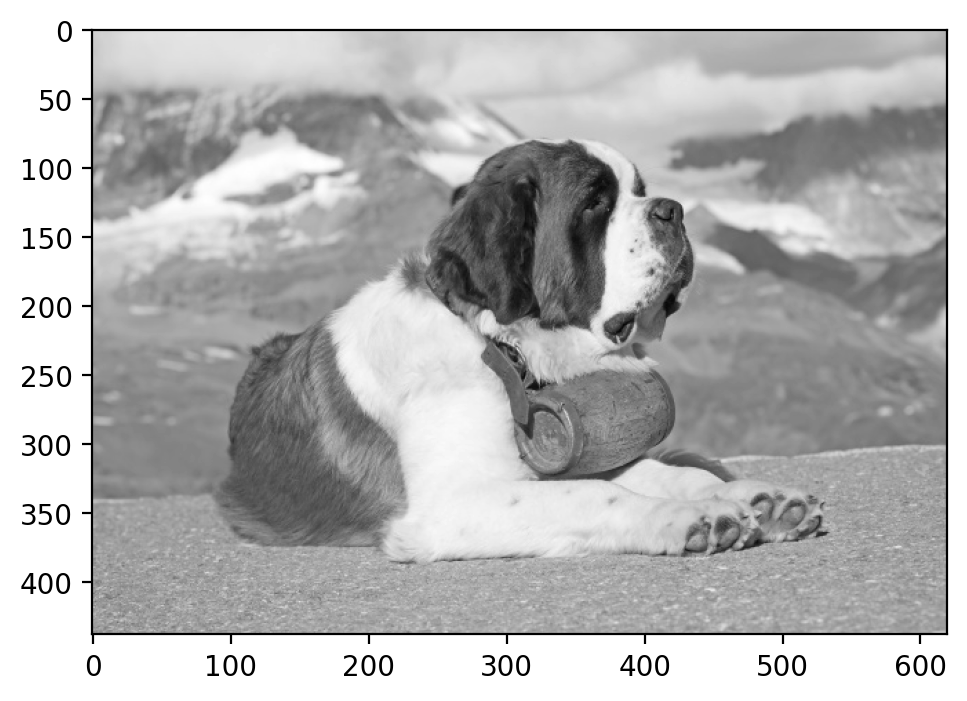

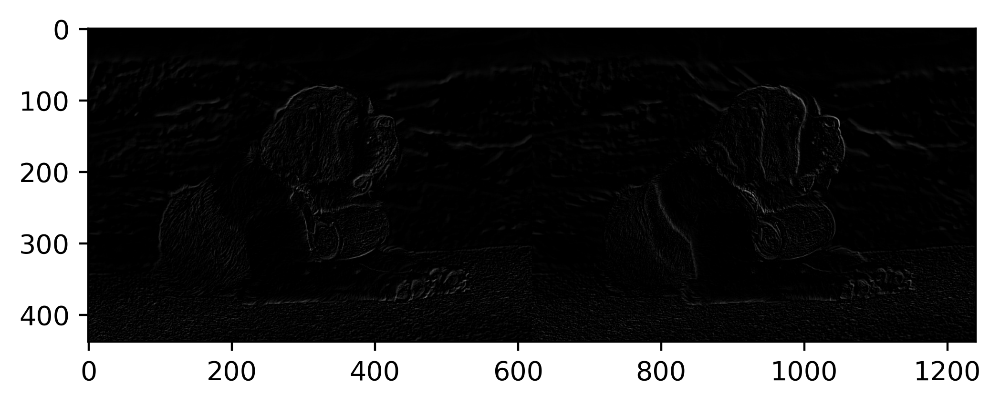

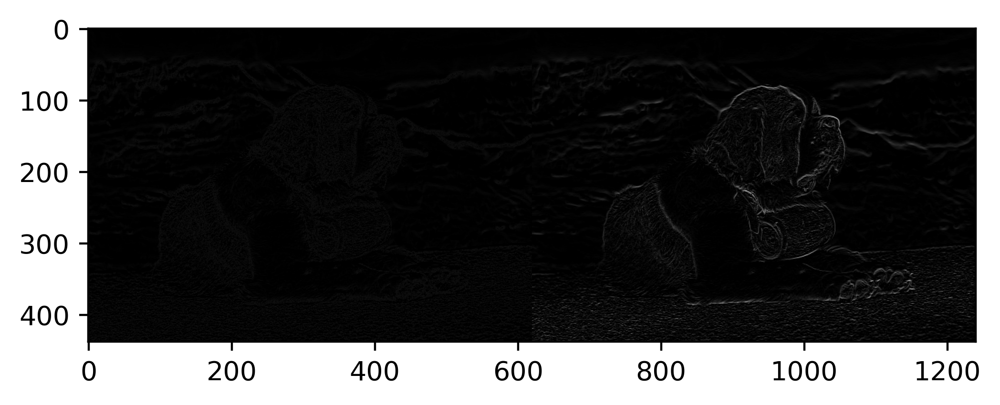

In [3]:
# 2. Приложете оператори на Робъртс и Собел върху photo.jpg, конвертирано към полутоново изображение.

# Roberts' edge detection

kernel_x = np.array([[1, 0],
                     [0, -1]])
kernel_y = np.array([[0, 1],
                     [-1, 0]])

filtered_x = cv.filter2D(photo_gray, -1, kernel_x)
filtered_y = cv.filter2D(photo_gray, -1, kernel_y)
filtered = np.sqrt(filtered_x ** 2 + filtered_y ** 2).astype(np.uint8)
filtered_fast = (filtered_x + filtered_y).astype(np.uint8)

plt.figure(dpi=200)
plt.imshow(photo_gray, 'gray', vmin=0, vmax=255)

plt.figure(dpi=400)
plt.imshow(np.concatenate((filtered_x, filtered_y), axis=1), 'gray', vmin=0, vmax=255)

plt.figure(dpi=400)
plt.imshow(np.concatenate((filtered, filtered_fast), axis=1), 'gray', vmin=0, vmax=255)

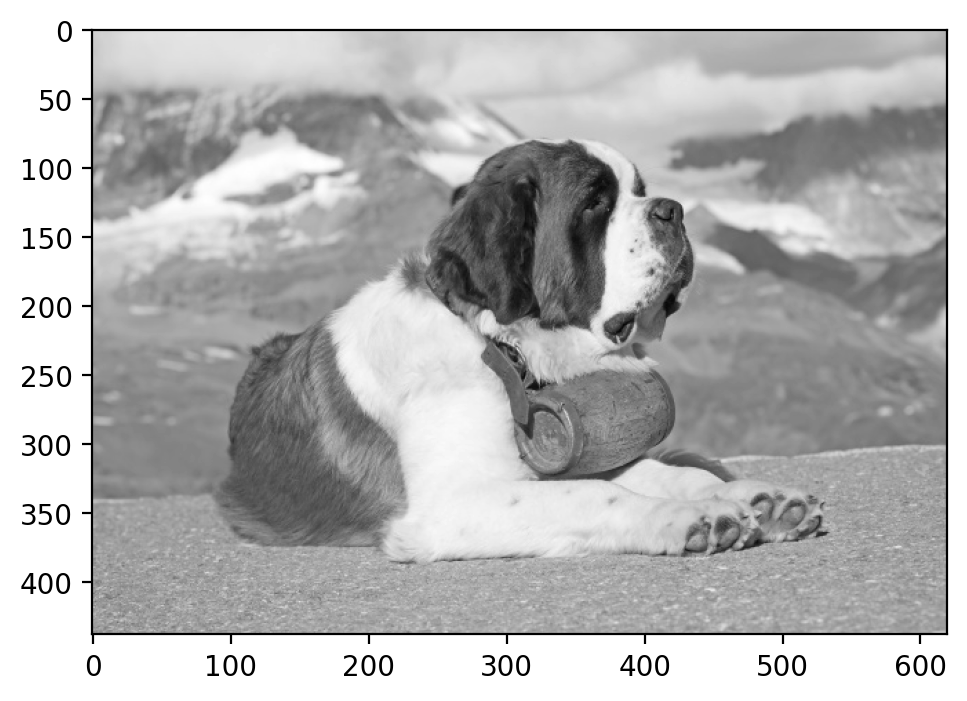

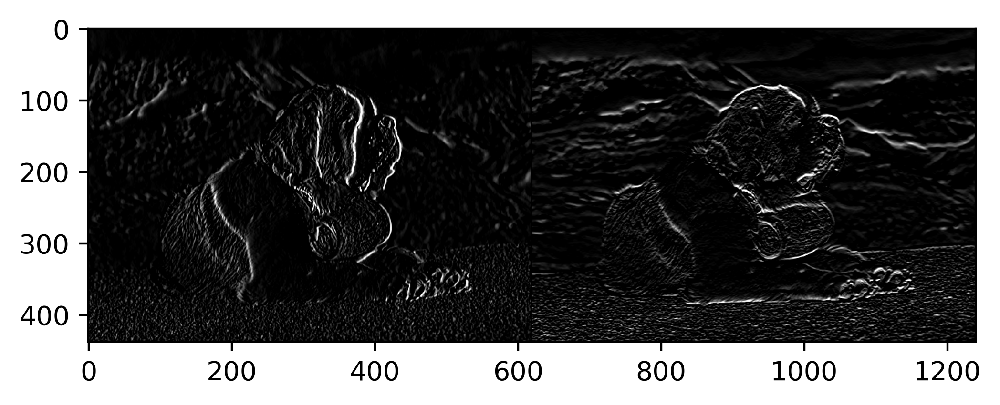

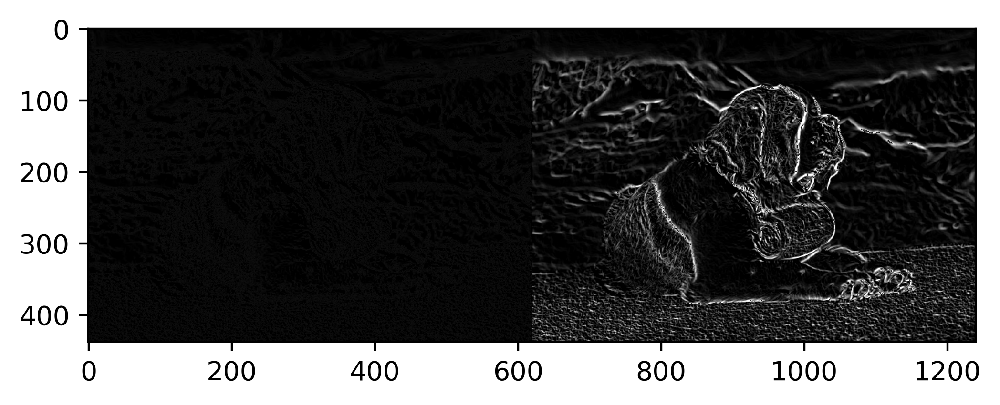

In [4]:
# Sobel's edge detection

kernel_x = np.array([[-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]])
kernel_y = np.array([[1, 2, 1],
                     [0, 0, 0],
                     [-1, -2, -1]])

filtered_x = cv.filter2D(photo_gray, -1, kernel_x)
filtered_y = cv.filter2D(photo_gray, -1, kernel_y)
filtered = np.sqrt(filtered_x ** 2 + filtered_y ** 2).astype(np.uint8)
filtered_fast = (filtered_x + filtered_y).astype(np.uint8)

plt.figure(dpi=200)
plt.imshow(photo_gray, 'gray', vmin=0, vmax=255)

plt.figure(dpi=400)
plt.imshow(np.concatenate((filtered_x, filtered_y), axis=1), 'gray', vmin=0, vmax=255)

plt.figure(dpi=400)
plt.imshow(np.concatenate((filtered, filtered_fast), axis=1), 'gray', vmin=0, vmax=255)

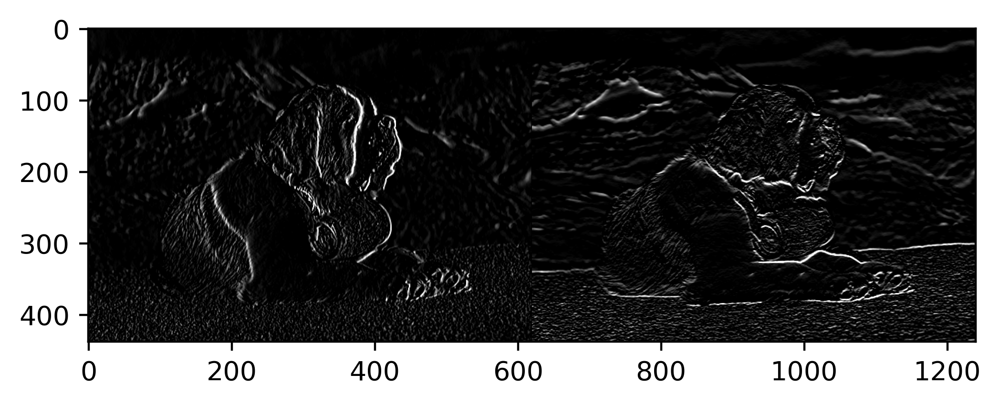

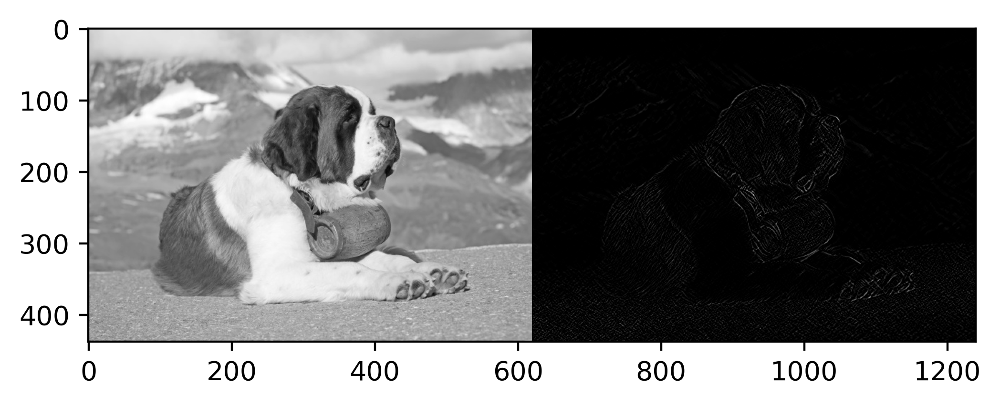

In [5]:
# Using OpenCV
filtered_opencv_x = cv.Sobel(src=photo_gray, ddepth=-1, dx=1, dy=0, ksize=3)
filtered_opencv_y = cv.Sobel(src=photo_gray, ddepth=-1, dx=0, dy=1, ksize=3)
filtered_opencv = cv.Sobel(src=photo_gray, ddepth=-1, dx=1, dy=1, ksize=3)

plt.figure(dpi=400)
plt.imshow(np.concatenate((filtered_opencv_x, filtered_opencv_y), axis=1), 'gray', vmin=0, vmax=255)

plt.figure(dpi=400)
plt.imshow(np.concatenate((photo_gray, filtered_opencv), axis=1), 'gray', vmin=0, vmax=255)

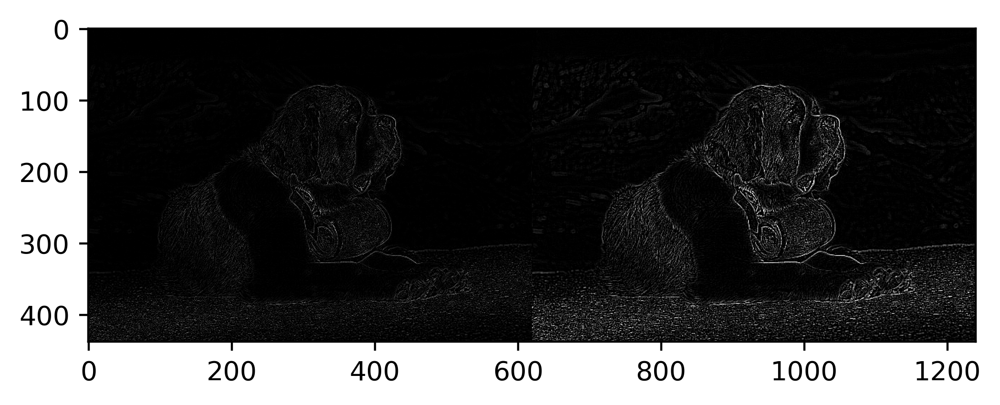

In [6]:
# 3. Приложете оператор на Лаплас върху полутоновото photo.jpg. Приложете и Composite Laplacian Mask върху същото изображение. Сравнете получените резултати.

laplace_4 = np.array([[ 0, -1,  0],
                      [-1,  4, -1],
                      [ 0, -1,  0]])
laplace_8 = np.array([[-1, -1, -1],
                      [-1,  8, -1],
                      [-1, -1, -1]])

filtered_4 = cv.filter2D(photo_gray, -1, laplace_4)
filtered_8 = cv.filter2D(photo_gray, -1, laplace_8)

plt.figure(dpi=400)
plt.imshow(np.concatenate((filtered_4, filtered_8), axis=1), 'gray', vmin=0, vmax=255)

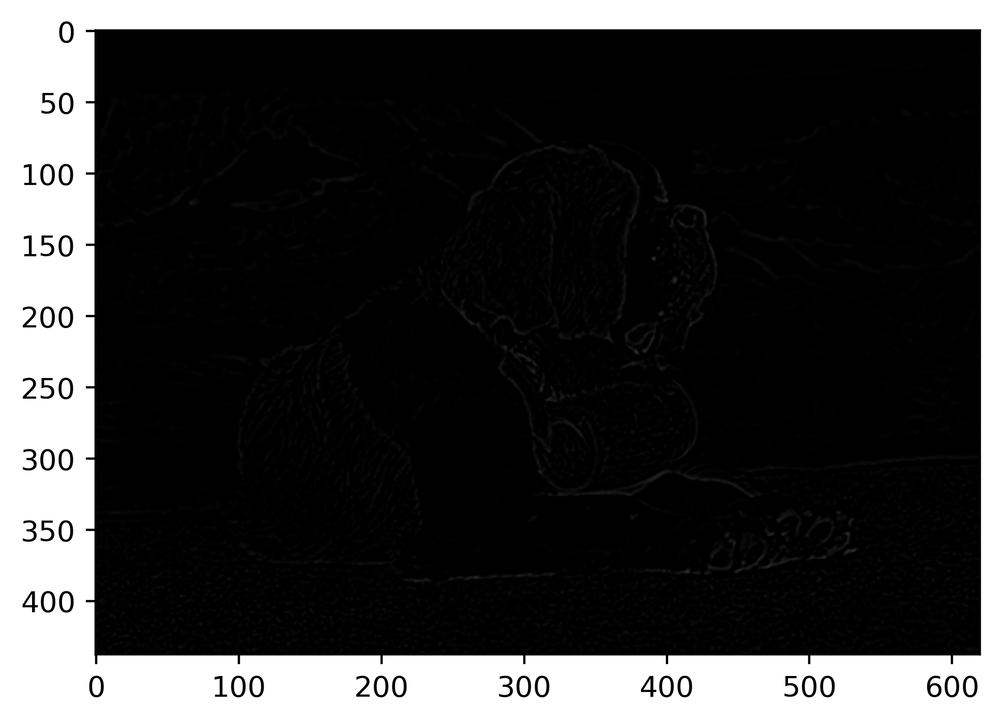

In [7]:
# Using OpenCV

gaussian = cv.GaussianBlur(photo_gray, ksize=(5, 5), sigmaX=0)
laplace = cv.Laplacian(gaussian, ddepth=-1)

plt.figure(dpi=400)
plt.imshow(laplace, 'gray', vmin=0, vmax=255)

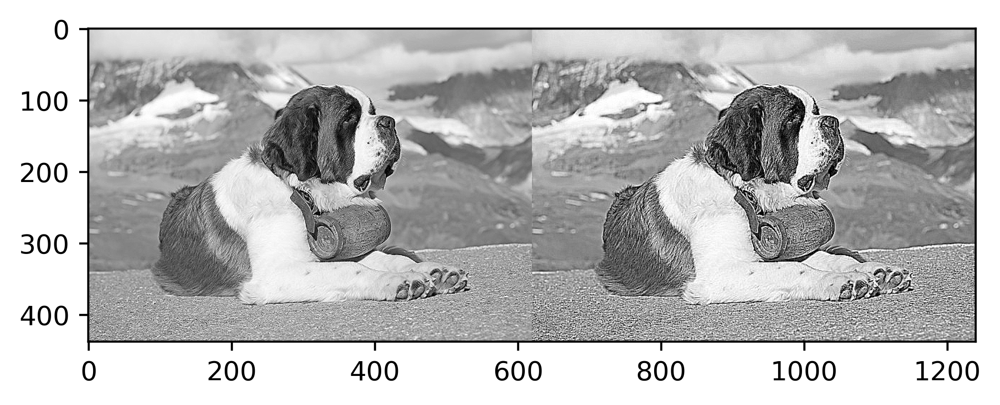

In [8]:
composite_4 = np.array([[ 0, -1,  0],
                        [-1,  5, -1],
                        [ 0, -1,  0]])
composite_8 = np.array([[-1, -1,  -1],
                        [-1,  9, -1],
                        [-1, -1, -1]])

filtered_4 = cv.filter2D(photo_gray, -1, composite_4)
filtered_8 = cv.filter2D(photo_gray, -1, composite_8)

plt.figure(dpi=400)
plt.imshow(np.concatenate((filtered_4, filtered_8), axis=1), 'gray', vmin=0, vmax=255)

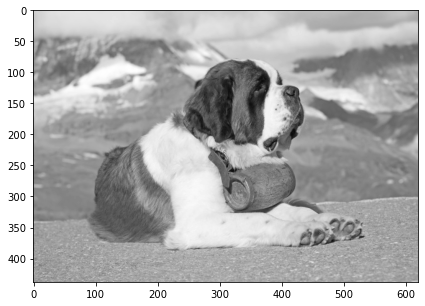

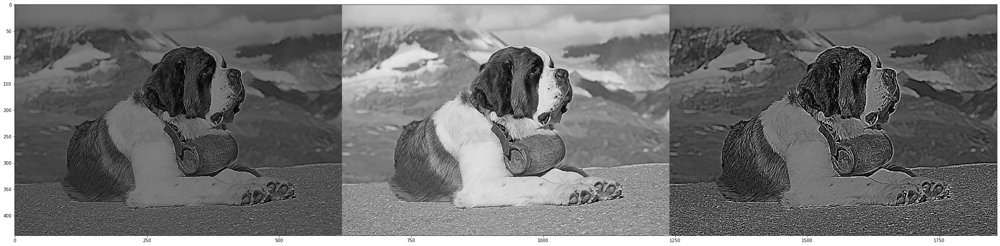

In [9]:
# 4. Приложете High-boost филтър върху върху полутоновото photo.jpg. Сравнете
# получените резултати при различни стойности на параметъра A и при използването на
# двата различни вида маски.

high_boost_4_5 = np.array([[ 0,   -1,  0],
                           [-1,  4.5, -1],
                           [ 0,   -1,  0]])
high_boost_8_5 = np.array([[-1,   -1, -1],
                           [-1,  8.5, -1],
                           [-1,   -1, -1]])

high_boost_4_9 = np.array([[ 0,   -1,  0],
                           [-1,  4.9, -1],
                           [ 0,   -1,  0]])
high_boost_8_9 = np.array([[-1,   -1, -1],
                           [-1,  8.9, -1],
                           [-1,   -1, -1]])

output_high_boost_4_5 = cv.filter2D(photo_gray, -1, high_boost_4_5)
output_high_boost_4_9 = cv.filter2D(photo_gray, -1, high_boost_4_9)

output_high_boost_8_5 = cv.filter2D(photo_gray, -1, high_boost_8_5)
output_high_boost_8_9 = cv.filter2D(photo_gray, -1, high_boost_8_9)


# show the images
plt.figure(figsize=(40,5))
plt.imshow(photo_gray, 'gray', vmin=0, vmax=255)
plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((output_high_boost_4_5,
                           output_high_boost_4_9,
                           output_high_boost_8_5), axis=1), 'gray', vmin=0, vmax=255)

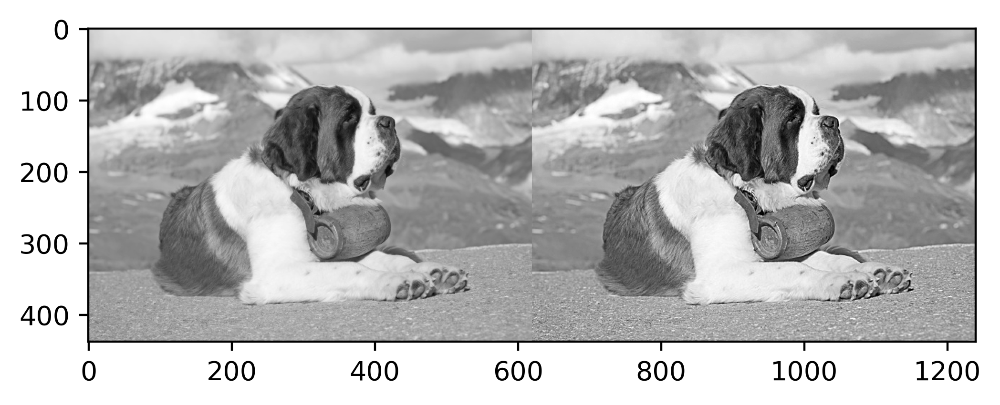

In [10]:
# Using OpenCV as described in https://theailearner.com/2019/05/14/unsharp-masking-and-highboost-filtering/

# Blur the image
gaussian = cv.GaussianBlur(photo_gray, (7,7), 0)
# Apply Unsharp masking
unsharp_image = cv.addWeighted(photo_gray, 2, gaussian, -1, 0)

plt.figure(dpi=400)
plt.imshow(np.concatenate((photo_gray, unsharp_image), axis=1), 'gray', vmin=0, vmax=255)

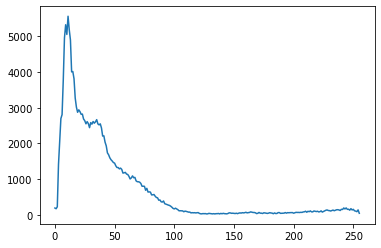

In [11]:
# 5. Визуализирайте хистограмата на ball.jpg.

ball_histogram, _ = np.histogram(ball, bins=histogram_bins_edges)
plt.plot(ball_histogram)

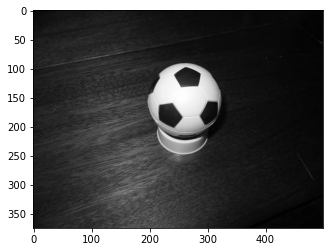

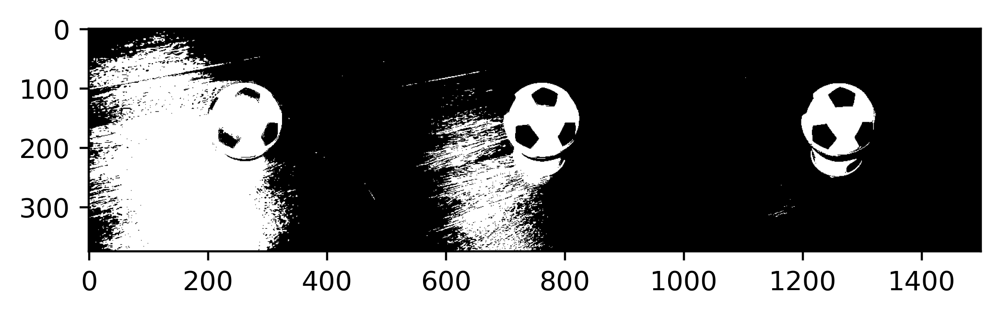

In [21]:
# 6. Бинаризирайте ball.jpg с прагове 32, 64 и 128.

_, ball_threshold_32 = cv.threshold(ball, 32, 255, cv.THRESH_BINARY)
_, ball_threshold_64 = cv.threshold(ball, 64, 255, cv.THRESH_BINARY)
_, ball_threshold_128 = cv.threshold(ball, 128, 255, cv.THRESH_BINARY)

plt.figure()
plt.imshow(ball, 'gray', vmin=0, vmax=255)

plt.figure(dpi=400)
plt.imshow(np.concatenate((ball_threshold_32, ball_threshold_64, ball_threshold_128), axis=1), 'gray', vmin=0, vmax=255)

threshold: 118.0
gaussian_threshold: 118.0


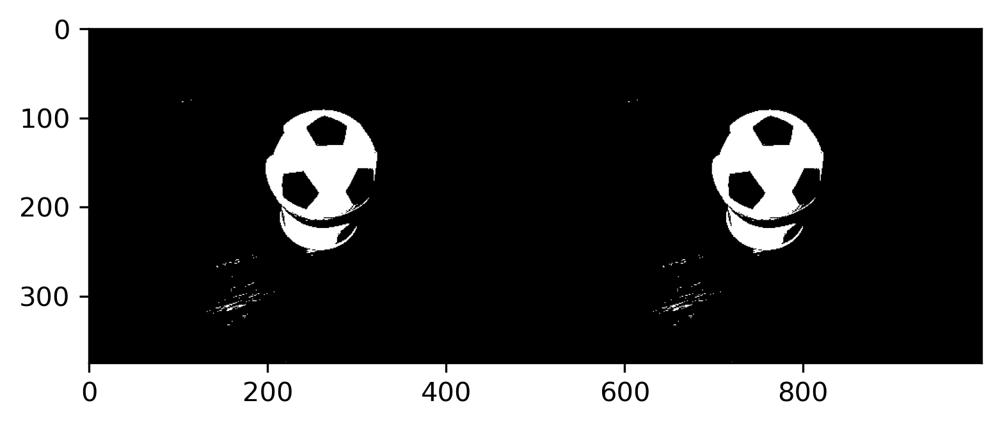

In [25]:
# 7. Бинаризирайте ball.jpg по метода на Otsu.

threshold, binarized = cv.threshold(ball, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Denoises
gaussian = cv.GaussianBlur(photo_gray, (7,7), 0)
gaussian_threshold, gaussian_binarized = cv.threshold(ball, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

print(f'threshold: {threshold}')
print(f'gaussian_threshold: {gaussian_threshold}')
plt.figure(dpi=300)
plt.imshow(np.concatenate((binarized, gaussian_binarized), axis=1), 'gray', vmin=0, vmax=255)

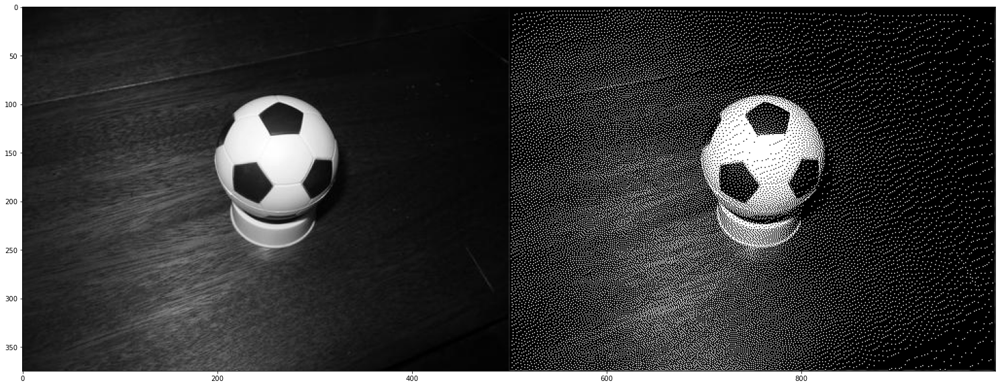

In [29]:
# 8. Приложете алгоритъма на Флойд-Щайнберг за разпространяване на грешката върху ball.jpg

result = ball.astype(np.float64)
 
fs_matrix = np.array((( np.nan, np.nan, 7/16 ),
                      (   3/16,   5/16, 1/16 )), dtype=np.float64);

fs_mask = np.array(((False, False, True),
                    ( True,  True, True)), dtype=bool)

rows, cols = ball.shape
for y in range(1, rows - 1):
    for x in range(1, cols - 1):
        val = result[y, x]
        new_val = (val >= 127) and 255 or 0
        error = val - new_val
        result[y, x] = new_val

        view = result[y:y + 2, x - 1:x + 2]
        new_view = view + error * fs_matrix
        np.putmask(view, fs_mask, new_view)

result = np.clip(result, 0, 255).astype(np.uint8)

plt.figure(figsize=(40,10))
plt.imshow(np.concatenate((ball,
                           result), axis=1), 'gray')